## Paqueterias

In [1]:
import pandas as pd
import numpy as np 
import random
import re
import nltk
from unidecode import unidecode
import unicodedata
import langdetect 
from textblob import TextBlob
import spacy
from category_encoders import TargetEncoder
from datetime import datetime
import itertools
from itertools import chain
from functools import reduce
import os

from  scipy.stats  import  normaltest
from scipy import stats
from scipy.stats import chisquare
from scipy.stats import ks_2samp
from scipy.stats import kruskal
from statsmodels.stats.multicomp import MultiComparison
from varclushi import VarClusHi

from nltk.stem import SnowballStemmer
from nltk.corpus import stopwords
from nltk import FreqDist
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.manifold import MDS,TSNE
from sklearn.cluster import AgglomerativeClustering,KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectKBest
from sklearn.feature_extraction.text import CountVectorizer

import cufflinks as cf
from plotly.offline import plot,iplot
pd.options.plotting.backend = "plotly"
import plotly.graph_objects as go
import plotly.express as px
from palettable.scientific.diverging import Berlin_20
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
import stylecloud
from palettable.cartocolors.qualitative import Bold_6
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator


from mod_one import *
from mod_two import *
from openpyxl import load_workbook

cf.go_offline()
pd.set_option('display.max_columns',None)

## Funciones auxiliares

In [2]:
def semiverseno(geo1, geo2):
    """
    This uses the ‘haversine’ formula to calculate the great-circle distance between two points – that is,
    the shortest distance over the earth’s surface – giving an ‘as-the-crow-flies’ distance between the points
    (ignoring any hills they fly over, of course!).
    Haversine
    formula:    a = sin²(Δφ/2) + cos φ1 ⋅ cos φ2 ⋅ sin²(Δλ/2)
    c = 2 ⋅ atan2( √a, √(1−a) )
    d = R ⋅ c
    where   φ is latitude, λ is longitude, R is earth’s radius (mean radius = 6,371km);
    note that angles need to be in radians to pass to trig functions!
    """
    lat1,lon1 = geo1
    lat2,lon2 = geo2
    try:
        R = 6371.0088
        lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])

        dlat = lat2 - lat1
        dlon = lon2 - lon1
        a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
        c = 2 * np.arctan2(a ** 0.5, (1 - a) ** 0.5)
        d = R * c
        return float(round(d, 4))
    except:
        return 0.0
    
    
def vectorizer(col,df_aux):    
    count_v=df_aux[col]
    
    X_train,X_test=train_test_split(count_v,test_size=.2,random_state=1235)
    cv = CountVectorizer(binary=True)
    train_X = cv.fit_transform(X_train).toarray()
    test_X = cv.transform(X_test).toarray()
    
    headers = sorted(cv.vocabulary_.keys())
    amenities=pd.DataFrame(cv.transform(df_aux.t_amenities).toarray(), columns=headers)
    
    df_aux=pd.concat([df_aux,amenities],axis=1)
    
    return df_aux

def normalizar(df,v,umbral=0.05):
    aux = df[v].value_counts(1).to_frame().reset_index()
    aux['mapa'] = np.where(aux[v]<umbral,'OTROS',aux['index'])
    mas_grande = aux.head(1)['index'].values[0]
    if aux.loc[aux['mapa']=='OTROS'][v].sum()<umbral:
        aux['mapa'] = aux['mapa'].replace({'OTROS':mas_grande})
    return v,dict(aux[['index','mapa']].values.tolist())

# Proyecto final

**Hernández Castellanos David**

## Introducción

Considero que el sistema de intermediación de Airbnb en la Ciudad de México aún no comienza a ser explotado para una ciudad tan turística y concurrida como lo es la Capital, me gustaría aprovechar los datos para generar herramientas que permitan explotar todas las cualidades que tienen las propiedas y lograr expandir de manera inteligente el mercado de alquiler en la ciudad

## Objetivo

Mi objetivo inicial es descubrir la características que definen un precio adecuado para una propiedad de acuerdo a sus características, gracias a esta información definir un estándar de calidad que permita incrementar el valor de las propiedas y el promedio de ventas por noche.

Posteriormente me gustaría realizar una segmetación de las propiedades para definir las relaciones que se pueden establecer entre sus características para poder realizar agrupaciones, por ejemplo, las propiedades 'departamentos con 3 habitaciones con precio $1,000 por noche, ubicadas en condesa y reserva inmediata' tienen mayor numero de reservaciones, con esta información se puede definir un patrón de inversión que permita aumentar el número de rentas de ciertas propiedades o descubrir nuevas propiedades potenciales.

# Dataset

In [3]:
df=pd.read_csv('listingsfeb.csv', encoding='latin-1')

/Users/davidhdz/opt/anaconda3/envs/diplomado/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3169: DtypeWarning:

Columns (61,62) have mixed types.Specify dtype option on import or set low_memory=False.



In [4]:
df.shape

(21663, 106)

## Etiquetado de variables

In [5]:
llaves=['id', #id de la propiedad anunciada
        'listing_url', #url de la propiedad
        'scrape_id', #id del corte de los datos
        'thumbnail_url', #Url de vista previa
        'medium_url', # Url de vista previa extendido
        'picture_url', #Url de imagenes
        'xl_picture_url', # Url de imagen extendida
        'host_id', # id del host
        'host_url', #url perfil del host
        'host_thumbnail_url', #url de vista previa perfil del host
        'host_picture_url', #url foto de host
        'license', #Licencia propiedad
       ]
#Continuas
c_feats=['host_listings_count', #Publicaciones realizadas por el host
         'host_total_listings_count', #Total de publicaciones realizadas por el host
         'latitude', #Latitud
         'longitude', #Longitud
         'bathrooms', #Numero de baños
         'square_feet', #Tamaño de la propiedad en pies
         'price', #Precio en pesos por noche
         'weekly_price', #Precio por semana
         'monthly_price', #Precio por mes
         'security_deposit', # Deposito de seguridad
         'cleaning_fee', #Cuota de limpieza
         'extra_people', #Precio por persona extra
         'minimum_nights_avg_ntm', # Promedio de noches minimas
         'maximum_nights_avg_ntm', #Promedio de noches maximas
]
#Discretas
v_feats=['host_response_rate', #Rate sobre respuesta del host
         'host_acceptance_rate', #Rate sobre tiempo de aprobacion del host
         'host_is_superhost', #Clasificacion de superhost
         'host_has_profile_pic', #Verificacion de foto de perfil host
         'host_identity_verified', #Host verificado
         'zipcode', #codigo postal
         'is_location_exact', #Verificacion localizacion exacta
         'accommodates', #Numero de huespedes
         'bedrooms', #Numero de habitaciones
         'beds', #Numero de camas
         'guests_included', #Huespedes incluidos por precio
         'minimum_nights', #Noches minimas
         'maximum_nights', #Noches maximas
         'minimum_minimum_nights', #Minimo de noches minimas
         'maximum_minimum_nights', #Maximo de noches minimas
         'minimum_maximum_nights', #Minimo de noches maximas
         'maximum_maximum_nights', #Maximo de noches maximas
         'has_availability', #Verificacion de disponibilidad
         'availability_30', #Dias disponibles en los siguientes 30 dias
         'availability_60',#Dias disponibles en los siguientes 60 dias
         'availability_90',#Dias disponibles en los siguientes 90 dias
         'availability_365',#Dias disponibles en los siguientes 365 dias
         'number_of_reviews', #Numero de criticas
         'number_of_reviews_ltm', #Numero de criticas en el ultimo mes 
         'reviews_per_month', #Criticas por mes    
         'review_scores_rating', #rate de criticas para la propiedad
         'review_scores_accuracy', #Rate sobre la veracidad de los datos
         'review_scores_cleanliness', #Rate sobre la limpieza
         'review_scores_checkin', #Rate sobre el checkin
         'review_scores_communication', #Rate sobre la comunicacion con el host
         'review_scores_location', #Rate sobre la ubicacion
         'review_scores_value', #Rate sobre la calidad
         'requires_license',#Requisito de licencia
         'instant_bookable', #Verificacion reserva instantanea
         'is_business_travel_ready', #Preparada para viajes de negocios
         'require_guest_profile_picture', #Solicita foto de huesped
         'require_guest_phone_verification', #Solicita telefono de huesped
         'calculated_host_listings_count', #Conteo de publicaciones del host
         'calculated_host_listings_count_entire_homes', #Conteo de publicaciones de casas enteras del host
         'calculated_host_listings_count_private_rooms', #Conteo de publicaciones de habitaciones privadas del host
         'calculated_host_listings_count_shared_rooms',#Conteo de publicaciones de habitaciones compartidas del host
         'neighbourhood_cleansed', #Alcaldia
         'calendar_updated', #Ultima actualizacion del calendario
         'property_type', #tipo de propiedad
         'cancellation_policy', #Politica de cancelacion
         'room_type', #Tipo de habitacion
         'bed_type' #tipo de cama
         ]
#Fechas
d_feats=['last_scraped', #Fecha en la que se obtuvieron los datos
         'host_since', #Fecha de registro del host
         'calendar_last_scraped', #Fecha de ultimo corte de informacion
         'first_review', #Fecha de primer review
         'last_review', #Fecha de ultimo review
         ] 
#Texto
t_feats=['name', #Titulo del anuncio
         'summary', #Resumen de la propiedad
         'space', # Resumen del espacio
         'description', #Descripcion de la propiedad
         'experiences_offered', #Experiencias ofrecidas por la propiedad
         'neighborhood_overview', #Resumen del vecindario
         'notes', #Notas del host
         'transit', #Accesibilidad de la ubicacion del inmueble
         'access', #Zonas disponibles en la casa
         'interaction', #Formas de comunicacion con host
         'house_rules', #Reglas de la propiedad  
         'host_name', #nombre del host
         'host_location', # Localización del host
         'host_about', #Descripcion del host
         'host_response_time', #Tiempo de respuesta del host
         'host_neighbourhood', #vecindario host
         'host_verifications', #documentos de verificacion del host
         'street', #calle de la propiedad
         'neighbourhood', #Colonia
         'neighbourhood_group_cleansed', #Grupo de Alcaldias
         'city', #Ciudad
         'state', #Estado
         'market', #Mercado de propiedades ubicacion
         'smart_location', #Ubicacion simplificada
         'country_code', #Codigo de pais
         'country', #Pais
         'amenities', #amenidades
         'jurisdiction_names', #claves localizacion
         ] 

c_feats_new=["c_"+x for x in c_feats]
v_feats_new=["v_"+x for x in v_feats]
d_feats_new=["d_"+x for x in d_feats]
t_feats_new=["t_"+x for x in t_feats]

df.rename(columns=dict(zip(d_feats,d_feats_new)),inplace=True)
df.rename(columns=dict(zip(v_feats,v_feats_new)),inplace=True)
df.rename(columns=dict(zip(t_feats,t_feats_new)),inplace=True)
df.rename(columns=dict(zip(c_feats,c_feats_new)),inplace=True)

## Duplicados

In [6]:
print('Hay '+ str(df.duplicated().sum())+' duplicados')

Hay 0 duplicados


In [7]:
print('Hay '+ str(df.duplicated(subset=['id']).sum())+' duplicados por id')

Hay 0 duplicados por id


## Completitud

Se retiran las llaves, ya que no nos aportan información adicional para el análisis de la información.

**Nota: Recordar que corresponden a los id y url de las publicaciones**

In [8]:
df=df.drop(llaves, axis=1)

Se verifica la completitud de las variables y se retira las que cuentan con más de 20% de información nula

In [9]:
cp=completitud(df)
cp

,columna,total,completitud
0,t_neighbourhood_group_cleansed,21663,0.000000
1,c_square_feet,21585,0.003601
2,c_monthly_price,20678,0.045469
3,c_weekly_price,20640,0.047223
4,t_notes,13067,0.396806
5,t_access,10041,0.536491
6,c_security_deposit,9431,0.564649
7,t_house_rules,9033,0.583022
8,t_host_neighbourhood,8788,0.594331
9,t_host_about,8710,0.597932


In [10]:
colors=dict(zip(list(cp["columna"].values),Berlin_20.hex_colors))
fig = px.bar(cp, x="columna", y="completitud",color="columna",
             color_discrete_sequence=Berlin_20.hex_colors, title="COMPLETITUD")
layout = go.Layout(yaxis=dict(tickformat=".2%"))
fig.update_layout(layout)
fig.show()

In [11]:
incompletas=cp['columna'][cp['completitud']<.80].tolist()
df=df.drop(incompletas, axis=1)

Conservamos 68 variables después de retirar la información incompleta, de las cuales 15 presentan missings

In [12]:
cp=completitud(df)
colors=dict(zip(list(cp["columna"].values),Berlin_20.hex_colors))
fig = px.bar(cp, x="columna", y="completitud",color="columna",
             color_discrete_sequence=Berlin_20.hex_colors, title="COMPLETITUD")
layout = go.Layout(yaxis=dict(tickformat=".2%"))
fig.update_layout(layout)
fig.show()

## Consistencia | Análisis Exploratorio

Buscamos retirar la inscosistencias en las variables, modificar el tipo de dato de la variable y eliminar las variables unitarias que no nos aportan información. Dejaremos para otra sección el tratamiento de los outliers y los missings.

Vamos a inspeccionar las variables apoyandonos con gráficos cuando sea necesario para analizar la distribución de los datos

In [13]:
for i in df:
    print(i)
    display(df[i].value_counts())

d_last_scraped


2020-02-27    21663
Name: d_last_scraped, dtype: int64

t_name


Perfect Loft great Location                            38
HabitaciÃ³n/cocina compartida frente Estadio Azteca    27
Depto Amueblado NÃ¡poles World Trade Center WTC        13
Del Valle,depto amueblado completo para 4 personas     12
Rooms Polanco                                          12
                                                       ..
CÃ³modo Loft1,zona de Hospitales,CU,UIC,UVM, Salle      1
Contemporary & Luminous Place in Heart of Condesa       1
MÃ©xico a flor de piel, Nonoalco Tlatelolco             1
HabitaciÃ³n en Colonia Del Valle muy cÃ©ntrica          1
HabitaciÃ³n Cerca de Universidad ITAM y UNAM            1
Name: t_name, Length: 21049, dtype: int64

t_summary


Suite agradable, especial para aquellas personas que aman la privacidad.  Aprovechando el espacio al mÃ¡ximo.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

t_description


Suite agradable, especial para aquellas personas que aman la privacidad.  Aprovechando el espacio al mÃ¡ximo. La suite cuenta con cocineta ideal para cocinar a diario, un pequeÃ±o escritorio, un baÃ±o. EstarÃ© al tanto de cualquier inconveniente. En las calles aledaÃ±as se encuentran muchos restaurantes y tiendas para recorrer cualquier dÃ­a de la semana. La cercanÃ­a con la autopista del norte es un factor importante ya que permite una mayor movilidad, asÃ­ como las distintas formas para desplazarse, ya que, se cuenta con bicicletas, scooters y transporte pÃºblico.                                                                                                                                                                                                                                                                                                                                                                                                                                            

t_experiences_offered


none    21663
Name: t_experiences_offered, dtype: int64

t_host_name


Carlos             275
Alejandro          224
Jorge              204
Eduardo            198
Luis               168
                  ... 
Julie Ta             1
Annabelle            1
Iker                 1
Pako                 1
Christine Marie      1
Name: t_host_name, Length: 4088, dtype: int64

d_host_since


2016-08-22    98
2019-01-13    62
2016-01-04    57
2019-05-14    57
2019-08-15    54
              ..
2013-10-17     1
2011-08-18     1
2011-04-15     1
2013-04-25     1
2013-04-24     1
Name: d_host_since, Length: 2875, dtype: int64

t_host_location


Mexico City, Mexico City, Mexico         10197
Mexico City, Federal District, Mexico     3809
MX                                        2524
Mexico                                     992
Mexico City, Distrito Federal, Mexico      448
                                         ...  
Villahermosa, Tabasco                        1
Juriquilla, QuerÃ©taro, Mexico               1
Managua, Managua, Nicaragua                  1
Veracruz, Veracruz, Mexico                   1
Minneapolis, Minnesota, United States        1
Name: t_host_location, Length: 624, dtype: int64

t_host_response_time


within an hour        13092
within a few hours     2357
within a day           1597
a few days or more      732
Name: t_host_response_time, dtype: int64

v_host_response_rate


100%    12878
90%       598
0%        514
98%       497
99%       344
50%       268
80%       260
97%       208
96%       189
67%       182
92%       177
94%       158
75%       125
86%       119
95%       108
70%       108
93%        94
60%        93
88%        93
83%        91
91%        91
89%        74
33%        70
78%        48
87%        40
40%        34
71%        29
25%        29
85%        26
17%        23
82%        20
57%        18
77%        16
20%        14
30%        13
63%        13
43%        12
73%        12
58%        11
84%        10
59%        10
29%         7
65%         6
79%         6
76%         6
81%         5
74%         4
56%         4
44%         4
62%         3
41%         3
11%         3
64%         2
14%         2
68%         1
47%         1
55%         1
10%         1
13%         1
38%         1
Name: v_host_response_rate, dtype: int64

v_host_acceptance_rate


100%    8711
99%     1321
98%     1262
97%      817
96%      633
        ... 
36%        2
53%        2
27%        2
8%         1
47%        1
Name: v_host_acceptance_rate, Length: 84, dtype: int64

v_host_is_superhost


f    14187
t     7476
Name: v_host_is_superhost, dtype: int64

c_host_listings_count


1      7618
2      3504
3      1932
0      1868
4      1207
5       831
6       679
7       477
8       316
9       276
10      263
11      244
12      201
14      138
21      128
26      109
18      104
20       99
13       94
30       88
224      87
44       81
53       75
22       72
28       71
16       69
19       67
25       66
15       62
52       62
36       54
23       51
50       51
40       50
24       47
64       47
48       46
164      45
71       45
45       43
42       34
32       32
54       31
47       29
29       24
33       22
41       21
17       20
43       18
443      18
31       15
947      12
39        9
38        4
27        2
56        2
35        2
418       1
Name: c_host_listings_count, dtype: int64

c_host_total_listings_count


1      7618
2      3504
3      1932
0      1868
4      1207
5       831
6       679
7       477
8       316
9       276
10      263
11      244
12      201
14      138
21      128
26      109
18      104
20       99
13       94
30       88
224      87
44       81
53       75
22       72
28       71
16       69
19       67
25       66
15       62
52       62
36       54
23       51
50       51
40       50
24       47
64       47
48       46
164      45
71       45
45       43
42       34
32       32
54       31
47       29
29       24
33       22
41       21
17       20
43       18
443      18
31       15
947      12
39        9
38        4
27        2
56        2
35        2
418       1
Name: c_host_total_listings_count, dtype: int64

t_host_verifications


['email', 'phone']                                                                                                3013
['email', 'phone', 'reviews', 'jumio', 'offline_government_id', 'selfie', 'government_id', 'identity_manual']     1316
['email', 'phone', 'reviews', 'jumio', 'government_id']                                                           1157
['email', 'phone', 'reviews', 'jumio', 'offline_government_id', 'government_id']                                  1088
['email', 'phone', 'offline_government_id', 'selfie', 'government_id', 'identity_manual']                         1021
                                                                                                                  ... 
['email', 'phone', 'facebook', 'google', 'reviews', 'jumio', 'offline_government_id', 'kba', 'government_id']        1
['phone', 'google', 'reviews', 'jumio', 'offline_government_id', 'selfie', 'government_id', 'identity_manual']       1
['email', 'phone', 'facebook', 'google', 'kba'] 

v_host_has_profile_pic


t    21623
f       40
Name: v_host_has_profile_pic, dtype: int64

v_host_identity_verified


f    14923
t     6740
Name: v_host_identity_verified, dtype: int64

t_street


Ciudad de MÃ©xico, Ciudad de MÃ©xico, Mexico    14809
Ciudad de MÃ©xico, CDMX, Mexico                  2469
Ciudad de MÃ©xico, Distrito Federal, Mexico      1343
Mexico City, Federal District, Mexico             510
Ciudad de MÃ©xico, D.F., Mexico                   277
                                                ...  
CuauhtÃ©moc, Cd. de Mexico, Mexico                  1
Aguascalientes, Aguascalientes, Mexico              1
mexico df, df, Mexico                               1
Mexico City, Polanco, Mexico                        1
Juarez, Ciudad de MÃ©xico, Mexico                   1
Name: t_street, Length: 518, dtype: int64

v_neighbourhood_cleansed


CuauhtÃ©moc               8502
Miguel Hidalgo            3512
Benito JuÃ¡rez            3473
CoyoacÃ¡n                 1823
Ãlvaro ObregÃ³n          1041
Tlalpan                    908
Cuajimalpa de Morelos      461
Venustiano Carranza        406
Gustavo A. Madero          338
Iztacalco                  300
Iztapalapa                 291
Azcapotzalco               258
La Magdalena Contreras     153
Xochimilco                 141
TlÃ¡huac                    37
Milpa Alta                  19
Name: v_neighbourhood_cleansed, dtype: int64

t_city


Ciudad de MÃ©xico           19105
Mexico City                   875
JuÃ¡rez                       309
Centro                        286
Del Valle Norte               102
                            ...  
\nBenito JuÃ¡rez                1
Iztapalapa                      1
Santa MarÃ­a La Ribera          1
De los Reyes                    1
Colonia del Valle Centro        1
Name: t_city, Length: 290, dtype: int64

t_state


Ciudad de MÃ©xico                       15896
CDMX                                     2642
Distrito Federal                         1486
Federal District                          520
D.F.                                      311
                                        ...  
Ciudad de MÃ©xico, Ciudad de MÃ©xico        1
Ciudad de MÃ©xico C.P.                      1
Tlalpan, Distrito Federal                   1
Del Carmen                                  1
santa fe                                    1
Name: t_state, Length: 127, dtype: int64

v_zipcode


06700    1671
06100    1121
06000     778
06600     746
06140     733
         ... 
02409       1
11479       1
1400        1
29200       1
09836       1
Name: v_zipcode, Length: 861, dtype: int64

t_market


Mexico City              21617
Other (International)       17
Pochutla                     1
Santander                    1
Playa del Carmen             1
Name: t_market, dtype: int64

t_smart_location


Ciudad de MÃ©xico, Mexico                         19125
Mexico City, Mexico                                 875
JuÃ¡rez, Mexico                                     309
Centro, Mexico                                      286
Del Valle Norte, Mexico                             102
                                                  ...  
San Francisco Tecoxpa, Mexico                         1
Ciudad de MÃ©xico , Colonia Roma Norte, Mexico        1
Cdmex, Mexico                                         1
77710 playa del carmen, Mexico                        1
Josefa Ortiz de DomÃ­nguez , Mexico                   1
Name: t_smart_location, Length: 291, dtype: int64

t_country_code


MX    21663
Name: t_country_code, dtype: int64

t_country


Mexico    21663
Name: t_country, dtype: int64

c_latitude


19.42777    21
19.41546    19
19.42551    18
19.43427    16
19.35136    15
            ..
19.37930     1
19.36937     1
19.44703     1
19.44787     1
19.25945     1
Name: c_latitude, Length: 10910, dtype: int64

c_longitude


-99.17889    21
-99.15618    20
-99.17878    18
-99.16071    18
-99.17255    15
             ..
-99.14835     1
-99.17800     1
-99.19113     1
-99.28398     1
-99.14829     1
Name: c_longitude, Length: 9264, dtype: int64

v_is_location_exact


t    15497
f     6166
Name: v_is_location_exact, dtype: int64

v_property_type


Apartment                  13562
House                       3191
Condominium                 1581
Loft                        1146
Guest suite                  562
Serviced apartment           385
Guesthouse                   200
Boutique hotel               184
Bed and breakfast            178
Hostel                       138
Townhouse                    109
Tiny house                    75
Hotel                         75
Other                         65
Aparthotel                    56
Casa particular (Cuba)        30
Villa                         26
Cabin                         24
Chalet                        10
Dome house                    10
Cottage                       10
Nature lodge                   6
Bungalow                       6
Earth house                    5
Farm stay                      5
Dorm                           4
Campsite                       3
Cycladic house (Greece)        2
Barn                           2
Camper/RV                      2
Resort    

v_room_type


Entire home/apt    10941
Private room       10014
Shared room          386
Hotel room           322
Name: v_room_type, dtype: int64

v_accommodates


2     9017
4     3880
1     3328
3     1881
6     1350
5     1091
8      348
7      239
10     143
16     142
9       84
12      70
11      29
14      26
13      19
15      14
41       1
50       1
Name: v_accommodates, dtype: int64

c_bathrooms


1.0     14239
2.0      3356
1.5      2115
2.5       770
3.0       442
3.5       239
4.0       131
0.0        80
4.5        79
5.0        44
0.5        40
5.5        31
6.0        17
7.0        16
6.5         9
8.0         8
10.0        8
7.5         7
8.5         5
50.0        3
11.0        2
11.5        2
9.0         2
20.0        2
16.0        2
17.0        1
15.0        1
9.5         1
14.0        1
10.5        1
12.0        1
Name: c_bathrooms, dtype: int64

v_bedrooms


1.0     14073
2.0      4899
3.0      1348
0.0       796
4.0       286
5.0        90
6.0        55
7.0        24
10.0       21
9.0        21
8.0         9
12.0        5
11.0        5
50.0        3
16.0        2
20.0        2
24.0        1
15.0        1
Name: v_bedrooms, dtype: int64

v_beds


1.0     11623
2.0      5184
3.0      2310
4.0       955
0.0       485
5.0       378
6.0       206
7.0        87
8.0        81
9.0        49
10.0       39
16.0       24
11.0       12
12.0       10
18.0        8
14.0        8
13.0        8
20.0        6
36.0        4
50.0        3
15.0        3
25.0        2
22.0        2
21.0        2
35.0        1
30.0        1
19.0        1
Name: v_beds, dtype: int64

v_bed_type


Real Bed         21507
Pull-out Sofa       75
Futon               57
Airbed              15
Couch                9
Name: v_bed_type, dtype: int64

t_amenities


{}                                                                                                                                                                                                                                                                                                                                                       52
{Wifi,Kitchen,"Free parking on premises",Elevator,Essentials,Hangers,"Laptop friendly workspace"}                                                                                                                                                                                                                                                        26
{TV,"Cable TV",Wifi,Kitchen,"Pets allowed",Elevator,Heating,"Family/kid friendly",Washer,Dryer,"Hair dryer",Iron,"Childrenâs books and toys",Microwave,"Coffee maker","Cooking basics",Oven}                                                                                                                  

c_price


$498.00       840
$307.00       790
$345.00       719
$402.00       718
$192.00       716
             ... 
$7,223.00       1
$10,346.00      1
$4,848.00       1
$3,123.00       1
$26,977.00      1
Name: c_price, Length: 404, dtype: int64

v_guests_included


1     15195
2      3292
4      1129
3      1061
5       445
6       305
7        68
8        65
10       32
16       19
9        17
12       15
11        7
15        6
14        4
13        2
26        1
Name: v_guests_included, dtype: int64

c_extra_people


$0.00        11697
$100.00       1215
$200.00       1030
$150.00       1016
$192.00        728
             ...  
$2,700.00        1
$182.00          1
$523.00          1
$377.00          1
$247.00          1
Name: c_extra_people, Length: 315, dtype: int64

v_minimum_nights


1      9977
2      6855
3      2420
5       527
4       478
       ... 
89        1
39        1
55        1
80        1
183       1
Name: v_minimum_nights, Length: 65, dtype: int64

v_maximum_nights


1125    12037
30       1864
365       747
90        699
60        642
        ...  
1114        1
279         1
362         1
375         1
56          1
Name: v_maximum_nights, Length: 217, dtype: int64

v_minimum_minimum_nights


1      10224
2       6838
3       2289
5        502
4        460
       ...  
11         1
183        1
26         1
39         1
179        1
Name: v_minimum_minimum_nights, Length: 63, dtype: int64

v_maximum_minimum_nights


1      9223
2      7251
3      2644
4       553
5       546
       ... 
11        1
55        1
26        1
54        1
183       1
Name: v_maximum_minimum_nights, Length: 66, dtype: int64

v_minimum_maximum_nights


1125    13633
30       1516
365       685
90        565
60        518
        ...  
1114        1
279         1
362         1
375         1
56          1
Name: v_minimum_maximum_nights, Length: 209, dtype: int64

v_maximum_maximum_nights


1125    13675
30       1499
365       698
90        566
60        516
        ...  
1114        1
279         1
362         1
375         1
56          1
Name: v_maximum_maximum_nights, Length: 209, dtype: int64

c_minimum_nights_avg_ntm


1.0      9340
2.0      6584
3.0      2280
5.0       497
4.0       465
         ... 
93.0        1
26.2        1
20.6        1
363.0       1
27.8        1
Name: c_minimum_nights_avg_ntm, Length: 139, dtype: int64

c_maximum_nights_avg_ntm


1125.0    13633
30.0       1497
365.0       680
90.0        564
60.0        515
          ...  
2000.0        1
863.3         1
1004.0        1
383.0         1
201.0         1
Name: c_maximum_nights_avg_ntm, Length: 257, dtype: int64

v_calendar_updated


today            1875
a week ago       1773
2 weeks ago      1686
2 months ago     1480
3 weeks ago      1248
                 ... 
70 months ago       1
69 months ago       1
66 months ago       1
82 months ago       1
97 months ago       1
Name: v_calendar_updated, Length: 91, dtype: int64

v_has_availability


t    21663
Name: v_has_availability, dtype: int64

v_availability_30


0     5723
30    2535
29    1205
27    1174
28     876
26     782
23     624
24     520
25     513
20     453
1      423
22     423
21     421
13     408
12     399
19     372
18     369
15     369
11     361
10     351
14     349
17     340
16     338
9      329
7      323
6      314
8      313
5      274
2      271
3      264
4      247
Name: v_availability_30, dtype: int64

v_availability_60


0     4367
60    2483
59    1171
57    1085
58     813
      ... 
8       71
5       67
7       62
4       59
6       55
Name: v_availability_60, Length: 61, dtype: int64

v_availability_90


0     3683
90    2359
89    1230
87    1060
88     805
      ... 
8       33
22      33
16      31
6       31
14      27
Name: v_availability_90, Length: 91, dtype: int64

v_availability_365


0      2400
365    1570
362     594
364     555
179     501
       ... 
194       3
188       2
190       2
196       2
202       1
Name: v_availability_365, Length: 366, dtype: int64

d_calendar_last_scraped


2020-02-27    21663
Name: d_calendar_last_scraped, dtype: int64

v_number_of_reviews


0      4706
1      1949
2      1188
3       878
4       727
       ... 
524       1
323       1
269       1
285       1
495       1
Name: v_number_of_reviews, Length: 304, dtype: int64

v_number_of_reviews_ltm


0      6816
1      1905
2      1228
3       952
4       777
       ... 
169       1
106       1
122       1
170       1
159       1
Name: v_number_of_reviews_ltm, Length: 138, dtype: int64

v_requires_license


f    21663
Name: v_requires_license, dtype: int64

t_jurisdiction_names


{"Mexico City"," MX Zip Codes 5"}                                                                                 15720
{"Mexico City"," MX Zip Codes 3"," Mexico City"," MX Zip Codes 5"}                                                 4745
{"Ciudad de MÃ©xico"}                                                                                               760
{"Mexico City"," MX Zip Codes 3"}                                                                                    21
{"Mexico City"," MX Zip Codes 3"," Mexico City"," MX Zip Codes 5"," Estado de Mexico"," MX"}                         20
{"Mexico City"," MX Zip Codes 5"," Estado de Mexico"," MX"}                                                          18
{"Estado de Mexico"," MX (zip codes)"," Estado de Mexico"," MX"}                                                     15
{"Estado de Mexico"," MX (zip codes)"}                                                                               10
{"Mexico City"," MX Zip Codes 5"," Mexic

v_instant_bookable


t    12496
f     9167
Name: v_instant_bookable, dtype: int64

v_is_business_travel_ready


f    21663
Name: v_is_business_travel_ready, dtype: int64

v_cancellation_policy


flexible                       10282
moderate                        6494
strict_14_with_grace_period     4855
super_strict_30                   26
super_strict_60                    6
Name: v_cancellation_policy, dtype: int64

v_require_guest_profile_picture


f    21483
t      180
Name: v_require_guest_profile_picture, dtype: int64

v_require_guest_phone_verification


f    21466
t      197
Name: v_require_guest_phone_verification, dtype: int64

v_calculated_host_listings_count


1     9842
2     3486
3     2013
4     1052
5      840
6      672
7      511
8      328
9      288
10     250
12     204
11     187
43     172
18     144
14     140
16     112
21     105
15     105
13     104
25     100
32      96
45      90
30      90
87      87
19      76
20      60
27      54
51      51
17      51
47      47
23      46
46      46
22      44
41      41
38      38
36      36
31      31
24      24
Name: v_calculated_host_listings_count, dtype: int64

v_calculated_host_listings_count_entire_homes


0     8811
1     6577
2     1862
3      901
4      544
5      386
6      383
7      210
8      186
9      167
12     148
11     107
13     106
43      88
87      87
14      86
38      84
15      82
18      80
29      73
16      70
21      65
19      62
10      60
30      60
51      51
24      49
47      47
37      45
35      43
36      36
32      32
31      31
20      22
22      22
Name: v_calculated_host_listings_count_entire_homes, dtype: int64

v_calculated_host_listings_count_private_rooms


0     9858
1     5966
2     2225
3     1215
4      534
5      394
6      377
7      218
11     115
12     106
9      106
8      101
27      54
10      53
23      43
39      43
16      36
32      32
29      30
15      30
25      25
13      25
20      23
18      21
17      17
14      16
Name: v_calculated_host_listings_count_private_rooms, dtype: int64

v_calculated_host_listings_count_shared_rooms


0     21005
1       400
2       110
3        31
4        31
12       25
5        24
20       21
6         9
7         7
Name: v_calculated_host_listings_count_shared_rooms, dtype: int64

Se verifica que la variable objetivo, precio, corresponda al tipo de dato correcto

In [14]:
df['c_price'].value_counts()

$498.00       840
$307.00       790
$345.00       719
$402.00       718
$192.00       716
             ... 
$7,223.00       1
$10,346.00      1
$4,848.00       1
$3,123.00       1
$26,977.00      1
Name: c_price, Length: 404, dtype: int64

In [15]:
df['c_price']=df['c_price'].map(lambda x: str(x).replace('$','').replace(',',''))
df['c_price']=df['c_price'].map(float)

In [16]:
box(df,'c_price','Precios Airbnb en CDMX')

Se realiza un primer vistazo a la correlación de la variable objetivo con el resto de las variables para guiar las decisiones con respecto al conjunto de datos

In [17]:
correlacion=df.corr(method="spearman")
correlacion=abs(correlacion)
correlacion[["c_price"]].sort_values(by = 'c_price',ascending = False).style.background_gradient()

,c_price
c_price,1.000000
v_accommodates,0.586227
v_calculated_host_listings_count_entire_homes,0.557007
v_bedrooms,0.463490
v_calculated_host_listings_count_private_rooms,0.436985
v_beds,0.432985
c_bathrooms,0.341666
v_guests_included,0.326783
c_longitude,0.227807
c_latitude,0.209936


Se renombra la variable objetivo

In [18]:
df.rename(columns={'c_price':'tgt_price'}, inplace= True)

### Fechas

In [19]:
df['d_last_scraped'].value_counts()

2020-02-27    21663
Name: d_last_scraped, dtype: int64

Notamos que la variable 'd_last_scraped' solo tiene un valor, lo cual no nos aporta información para el análisis. Por esta razón se retira la variable del dataset

In [20]:
df=df.drop(['d_last_scraped'], axis=1)

Airbnb inició operaciones en México en el 2011 pero su creación fue en 2008 por lo que si hay fechas anteriores a ese año serían inconsistentes

In [21]:
df['d_host_since']=pd.to_datetime(df['d_host_since'])
g_aux=df['d_host_since'].map(lambda x: x.year)
g_aux=pd.DataFrame(g_aux)
g_aux['d_host_since'].value_counts()

2016    4362
2015    3353
2017    3319
2019    3106
2018    3048
2014    1877
2013    1090
2012     782
2020     332
2011     296
2010      86
2009      12
Name: d_host_since, dtype: int64

In [22]:
bar(g_aux,'d_host_since','Año de antigüedad host',12,x_title="",y_title="")

### Discretas

Un dato que podría determinar la preferencia de los clientes, es si el host tiene la distinción de 'Superhost' en la plataforma, reconocimiento especial que se otorga a las mejores propiedades y hosts por el servicio brindado. Quiero analizar la proporción de la variable para conocer si nos aporta información.

In [23]:
pie(df,'v_host_is_superhost','Proporción de Superhosts',x_title="",y_title="")

Otra variable que podría ser unitaria es la variable que nos indica si el host tiene una foto de perfil, por los beneficios que representa mostrar datos que generen confianza a los clientes, se puede pensar que una gran parte de los anfitriones tiene habilitado este rubro

In [24]:
pie(df,'v_host_has_profile_pic','Foto de perfil',x_title="",y_title="")

In [25]:
df['v_host_has_profile_pic']=df['v_host_has_profile_pic'].map(lambda x: 1 if x=='t' else 0)
aux_corr=df[['v_host_has_profile_pic','tgt_price']]
aux_corr.corr()

,v_host_has_profile_pic,tgt_price
v_host_has_profile_pic,1.000000,-0.000519
tgt_price,-0.000519,1.000000


Se retira la variable ya que no nos aporta información adicional

In [26]:
df=df.drop(['v_host_has_profile_pic'], axis=1)

De manera similar, quiero conocer si los host completan el proceso de verificación de indentidad, paso muy importante para registrar la propiedad de manera correcta

In [27]:
pie(df,'v_host_identity_verified','Anfitriones verificados',x_title="",y_title="")

Me sorprende mucho la información, debido a que la mayoría de los anfitriones no completan el proceso de verificación, es interesante analizar si afecta en el número de reservaciones que obtienen y en el precio que ofertan

Se verifica que la mayoría de los anfitriones comparte la localización exacta del inmueble a airbnb

In [28]:
pie(df,'v_is_location_exact','Ubicación exacta',x_title="",y_title="")

Se verifica que el número máximo de huespedes corresponda con el máximo de la plataforma que corresponde a 16

In [29]:
df['v_accommodates'].value_counts()

2     9017
4     3880
1     3328
3     1881
6     1350
5     1091
8      348
7      239
10     143
16     142
9       84
12      70
11      29
14      26
13      19
15      14
41       1
50       1
Name: v_accommodates, dtype: int64

In [30]:
bar(df,'v_accommodates','Número de huespedes',18,x_title="",y_title="")

Existen 2 datos que son incosistentes que corresponden a 41 y 50, los reemplazamos por los valores máximos de la plataforma que son 16 huespedes

In [31]:
df['v_accommodates']=df['v_accommodates'].map(lambda x: str(x).replace('41','16').replace('50','16'))
df['v_accommodates']=df['v_accommodates'].map(int)

Se retiran los % en 'v_host_response_rate' y 'v_host_acceptance_rate' para conservar un rango de 0-100

In [32]:
df['v_host_response_rate']=df['v_host_response_rate'].map(lambda x: str(x).replace('%',''))
df['v_host_response_rate']=df['v_host_response_rate'].map(float)
df['v_host_acceptance_rate']=df['v_host_acceptance_rate'].map(lambda x: str(x).replace('%',''))
df['v_host_acceptance_rate']=df['v_host_acceptance_rate'].map(float)

Se realiza limpieza para el código postal, se reemplazan con nulos los valores que no se tienen

In [33]:
df['v_zipcode']=df['v_zipcode'].map(lambda x:clean_text(str(x).lower(), pattern="[^0-9]").replace("\n","").replace(' ',''))
df['v_zipcode']=df['v_zipcode'].replace('',np.nan).replace('02 03810', '03810')
df['v_zipcode'].map(float)

0         6470.0
1            NaN
2         6140.0
3            NaN
4         6140.0
          ...   
21658    11560.0
21659    11550.0
21660     3100.0
21661     8000.0
21662     8000.0
Name: v_zipcode, Length: 21663, dtype: float64

Se asigna el tipo de dato correcto al resto de las variables discretas

In [34]:
discret=['v_guests_included','v_minimum_nights','v_maximum_nights','v_minimum_minimum_nights','v_maximum_minimum_nights',
        'v_minimum_maximum_nights', 'v_maximum_maximum_nights', 'v_availability_30', 'v_availability_60',
         'v_availability_90','v_availability_365','v_number_of_reviews','v_number_of_reviews_ltm',
        'v_calculated_host_listings_count','v_calculated_host_listings_count_entire_homes',
        'v_calculated_host_listings_count_private_rooms']

for x in discret:
    df[x]=df[x].map(int)

### Continuas

Revisamos que no existan inconsistencias en la latitud y longitud.
Latitud: 19.4978, Longitud: -99.1269 corresponde a la Ciudad de México

In [35]:
df['c_latitude']=df['c_latitude'].map(float)
df['c_longitude']=df['c_longitude'].map(float)

In [36]:
df[(df['c_latitude']<19) | (df['c_latitude']>19.8)]

,t_name,t_summary,t_description,t_experiences_offered,t_host_name,d_host_since,t_host_location,t_host_response_time,v_host_response_rate,v_host_acceptance_rate,v_host_is_superhost,c_host_listings_count,c_host_total_listings_count,t_host_verifications,v_host_identity_verified,t_street,v_neighbourhood_cleansed,t_city,t_state,v_zipcode,t_market,t_smart_location,t_country_code,t_country,c_latitude,c_longitude,v_is_location_exact,v_property_type,v_room_type,v_accommodates,c_bathrooms,v_bedrooms,v_beds,v_bed_type,t_amenities,tgt_price,v_guests_included,c_extra_people,v_minimum_nights,v_maximum_nights,v_minimum_minimum_nights,v_maximum_minimum_nights,v_minimum_maximum_nights,v_maximum_maximum_nights,c_minimum_nights_avg_ntm,c_maximum_nights_avg_ntm,v_calendar_updated,v_has_availability,v_availability_30,v_availability_60,v_availability_90,v_availability_365,d_calendar_last_scraped,v_number_of_reviews,v_number_of_reviews_ltm,v_requires_license,t_jurisdiction_names,v_instant_bookable,v_is_business_travel_ready,v_cancellation_policy,v_require_guest_profile_picture,v_require_guest_phone_verification,v_calculated_host_listings_count,v_calculated_host_listings_count_entire_homes,v_calculated_host_listings_count_private_rooms,v_calculated_host_listings_count_shared_rooms


In [37]:
df[(df['c_longitude']<-99.4) | (df['c_longitude']>-98.9)]

,t_name,t_summary,t_description,t_experiences_offered,t_host_name,d_host_since,t_host_location,t_host_response_time,v_host_response_rate,v_host_acceptance_rate,v_host_is_superhost,c_host_listings_count,c_host_total_listings_count,t_host_verifications,v_host_identity_verified,t_street,v_neighbourhood_cleansed,t_city,t_state,v_zipcode,t_market,t_smart_location,t_country_code,t_country,c_latitude,c_longitude,v_is_location_exact,v_property_type,v_room_type,v_accommodates,c_bathrooms,v_bedrooms,v_beds,v_bed_type,t_amenities,tgt_price,v_guests_included,c_extra_people,v_minimum_nights,v_maximum_nights,v_minimum_minimum_nights,v_maximum_minimum_nights,v_minimum_maximum_nights,v_maximum_maximum_nights,c_minimum_nights_avg_ntm,c_maximum_nights_avg_ntm,v_calendar_updated,v_has_availability,v_availability_30,v_availability_60,v_availability_90,v_availability_365,d_calendar_last_scraped,v_number_of_reviews,v_number_of_reviews_ltm,v_requires_license,t_jurisdiction_names,v_instant_bookable,v_is_business_travel_ready,v_cancellation_policy,v_require_guest_profile_picture,v_require_guest_phone_verification,v_calculated_host_listings_count,v_calculated_host_listings_count_entire_homes,v_calculated_host_listings_count_private_rooms,v_calculated_host_listings_count_shared_rooms


Observamos la distribución de las propiedades en un mapa

In [38]:
from keplergl import KeplerGl
map_1 = KeplerGl()
df["c_latitude"]=df["c_latitude"].map(lambda x:round(x,4))
df["c_longitude"]=df["c_longitude"].map(lambda x:round(x,4))
df_mapa=df[['t_name','c_latitude','c_longitude']]
map_1.add_data(data=df_mapa, name='data')
map_1.save_to_html()

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter
Map saved to keplergl_map.html!


Se asigna el tipo de dato correcto a la variable baños, es posible tener medio baño por lo que será tipo flotante

In [39]:
df['c_bathrooms'].map(float)

0        1.0
1        1.0
2        9.0
3        1.0
4        1.0
        ... 
21658    1.0
21659    1.0
21660    1.0
21661    1.0
21662    1.0
Name: c_bathrooms, Length: 21663, dtype: float64

Como con la variable objetivo, asignamos el tipo de dato correcto para el precio por huesped extra

In [40]:
df['c_extra_people']=df['c_extra_people'].map(lambda x: str(x).replace('$','').replace(',',''))
df['c_extra_people']=df['c_extra_people'].map(float)

Asignamos el tipo de dato correcto para el resto de variables

In [41]:
conti=['c_minimum_nights_avg_ntm', 'c_maximum_nights_avg_ntm']
for y in conti:
    df[y]=df[y].map(float)

Retiramos las variables unitarias del conjunto de datos ya que no nos brindan información y las variables cuya información se encuentra dentro de otras variables o es redundante, por ejemplo, se está analizando el mercado mexicano por lo que todas las propiedades tienen el código MX.

In [42]:
uni_redun=['v_has_availability','d_calendar_last_scraped','v_requires_license',
           'v_is_business_travel_ready','v_require_guest_profile_picture','v_require_guest_phone_verification',
          'v_calculated_host_listings_count_shared_rooms','t_experiences_offered','t_market','t_country_code','t_city',
          't_state','t_country','t_country_code','v_bed_type','t_jurisdiction_names','t_description']

In [43]:
df=df.drop(uni_redun, axis=1)

## Limpieza de texto

In [44]:
text=['t_name', 't_summary', 't_host_name','t_host_location','t_host_response_time','t_street','v_neighbourhood_cleansed','t_smart_location',
     'v_property_type','v_room_type','v_calendar_updated','v_cancellation_policy',]

for t in text:
    df[f'{t}']=df[f'{t}'].map(lambda x:clean_text(str(x).lower(), pattern="[^a-zA-Z0-9]").replace("\n",""))

Voy a homologar los criterios de CDMX para analizar de forma correcta la variable

In [45]:
df['t_host_location'].value_counts()

mexico city mexico city mexico         10197
mexico city federal district mexico     3809
mx                                      2524
mexico                                  1017
mexico city distrito federal mexico      448
                                       ...  
jaltenco state of mexico mexico            1
irapuato guanajuato mexico                 1
kiev kyiv city ukraine                     1
santa cruz california united states        1
basel basel stadt switzerland              1
Name: t_host_location, Length: 566, dtype: int64

In [46]:
df['t_host_location']=df['t_host_location'].map(lambda x: 'cdmx' if 'ciudad de mexico' in x else x)
df['t_host_location']=df['t_host_location'].map(lambda x: 'cdmx' if 'df' in x else x)
df['t_host_location']=df['t_host_location'].map(lambda x: 'cdmx' if 'd f' in x else x)
df['t_host_location']=df['t_host_location'].map(lambda x: 'cdmx' if 'federal district' in x else x)
df['t_host_location']=df['t_host_location'].map(lambda x: 'cdmx' if 'mexico city' in x else x)
df['t_host_location']=df['t_host_location'].map(lambda x: 'mexico' if x=='mx' else x)


freq_d=dict(zip(list(df['t_host_location'].value_counts(1)[-495:].index),["Otros"]*495))
df['t_host_location']=df['t_host_location'].replace(freq_d)
df['t_host_location'].value_counts(1).head()

cdmx                                        0.701057
mexico                                      0.163458
Otros                                       0.057979
ciudad de maxico ciudad de maxico mexico    0.020034
santiago de querataro querataro mexico      0.005816
Name: t_host_location, dtype: float64

Considero que lo mejor sería retirar la variable porque en la sección de mexico no tenemos especificación si se refiere a la ciudad de méxico en esta variable, la información tiene un elevado porcentaje de registros de la CDMX y no nos aporta información relevante

In [47]:
df=df.drop(['t_host_location'], axis=1)

Voy a analizar de manera similar 't_street' para ver si nos aporta información una vez sin caracteres especiales

In [48]:
df['t_street'].value_counts().head(10)

ciudad de maxico ciudad de maxico mexico    14831
ciudad de maxico cdmx mexico                 2477
ciudad de maxico distrito federal mexico     1347
mexico city federal district mexico           510
ciudad de maxico d f mexico                   279
juarez ciudad de maxico mexico                265
centro ciudad de maxico mexico                261
mexico city mexico city mexico                227
del valle norte ciudad de maxico mexico        83
ciudad de maxico mexico                        82
Name: t_street, dtype: int64

In [49]:
df['t_street'].value_counts().head(10).sum()/df.shape[0]

0.9399436827770854

Observé que los 10 valores más frecuentes no presentan información relevante fuera de estar en la ciudad de méxico y representan un 94% de los datos, por lo que decidí retirar esta variable al no aportar información útil

In [50]:
df=df.drop(['t_street'], axis=1)

Un caso similar ocurre con la variable 't_smart_location' donde los registros más frecuentes no aportan información relevante por lo que se retiró la variable

In [51]:
df['t_smart_location'].value_counts(1)

ciudad de maxico mexico         0.884827
mexico city mexico              0.040715
juarez mexico                   0.014310
centro mexico                   0.013295
del valle norte mexico          0.004708
                                  ...   
cuyutlan mexico                 0.000046
santa arsula coapa mexico       0.000046
san angel mexico                0.000046
santa maraa la ribera mexico    0.000046
marida mexico                   0.000046
Name: t_smart_location, Length: 247, dtype: float64

In [52]:
df=df.drop(['t_smart_location'], axis=1)

Para la variable 't_name' voy a retirar los registros que no tengan título ya que no es posible buscarlos en la plataforma y no nos aportan información

In [53]:
df['t_name_orig']=df['t_name']

In [54]:
df=df[df['t_name']!='']
df.reset_index(drop=True,inplace=True)

Para continuar con la limpieza del texto retiramos las stopwords en español y en inglés

In [55]:
lista_stopwords_es = stopwords.words("spanish")
lista_stopwords_en = stopwords.words("english")

In [56]:
df["t_name"]=df["t_name"].map(lambda x:" ".join(list(filter(lambda x:x not in lista_stopwords_es,x.split()))).strip())
df["t_name"]=df["t_name"].map(lambda x:" ".join(list(filter(lambda x:x not in lista_stopwords_en,x.split()))).strip())

Se verifica que después de este paso no queden registros en blanco

In [57]:
df[df['t_name']=='']

,t_name,t_summary,t_host_name,d_host_since,t_host_response_time,v_host_response_rate,v_host_acceptance_rate,v_host_is_superhost,c_host_listings_count,c_host_total_listings_count,t_host_verifications,v_host_identity_verified,v_neighbourhood_cleansed,v_zipcode,c_latitude,c_longitude,v_is_location_exact,v_property_type,v_room_type,v_accommodates,c_bathrooms,v_bedrooms,v_beds,t_amenities,tgt_price,v_guests_included,c_extra_people,v_minimum_nights,v_maximum_nights,v_minimum_minimum_nights,v_maximum_minimum_nights,v_minimum_maximum_nights,v_maximum_maximum_nights,c_minimum_nights_avg_ntm,c_maximum_nights_avg_ntm,v_calendar_updated,v_availability_30,v_availability_60,v_availability_90,v_availability_365,v_number_of_reviews,v_number_of_reviews_ltm,v_instant_bookable,v_cancellation_policy,v_calculated_host_listings_count,v_calculated_host_listings_count_entire_homes,v_calculated_host_listings_count_private_rooms,t_name_orig
3160,,ubicado en colonia condesa la mas trendy de la...,eduardo,2016-08-14,nan,NaN,NaN,f,1,1,"['email', 'phone', 'facebook', 'reviews', 'jum...",f,cuauhtamoc,06140,19.4158,-99.1776,t,apartment,private room,1,0.0,1.0,1.0,"{TV,Wifi,Kitchen,Heating,""Family/kid friendly""...",1092.0,1,0.0,1,1125,1,2,1125,1125,1.3,1125.0,43 months ago,30,60,90,365,6,0,f,flexible,1,0,1,m
8821,,nan,mauricio,2018-05-20,a few days or more,0.0,NaN,f,1,1,"['email', 'phone']",f,coyoacan,04600,19.3097,-99.1521,t,apartment,private room,1,1.0,0.0,1.0,"{Wifi,""First aid kit"",Essentials,""Lock on bedr...",192.0,1,0.0,10,60,10,10,60,60,10.0,60.0,11 months ago,30,60,90,90,0,0,t,flexible,1,0,1,e
11449,,s,luis,2018-01-24,nan,NaN,NaN,f,1,1,"['email', 'phone', 'jumio', 'offline_governmen...",f,alvaro obregan,01080,19.3416,-99.2057,f,apartment,private room,2,2.0,1.0,1.0,"{TV,Wifi,Kitchen,""Smoking allowed"",Gym,Elevato...",402.0,1,0.0,4,4,4,4,4,4,4.0,4.0,12 months ago,29,59,89,89,0,0,t,flexible,1,0,1,s
12676,,l,karla,2019-01-16,nan,NaN,100.0,f,1,1,"['email', 'phone']",f,coyoacan,04200,19.3400,-99.1414,t,bed and breakfast,private room,1,0.0,0.0,0.0,{},326.0,1,96.0,1,1125,1,1,1125,1125,1.0,1125.0,5 months ago,0,0,0,0,0,0,f,moderate,1,0,1,m
17418,,departamento en primer piso recian remodelado ...,mercedes francisca,2019-09-02,nan,NaN,100.0,f,1,1,"['email', 'phone', 'offline_government_id', 'g...",f,coyoacan,04930,19.3118,-99.1089,t,townhouse,entire home apt,4,2.0,2.0,2.0,"{TV,""Cable TV"",Wifi,Kitchen,""Free parking on p...",1897.0,1,0.0,3,28,3,3,28,28,3.0,28.0,2 months ago,9,33,63,63,1,1,f,moderate,1,1,0,o


In [58]:
df=df[df['t_name']!='']
df.reset_index(drop=True,inplace=True)

Obtenemos los hapaxes y los retiramos de la variable

In [59]:
corpus=' '.join(df['t_name'].values)
fdist=nltk.FreqDist(corpus.split())
list_hapaxes=fdist.hapaxes()

In [60]:
df['t_name']=df['t_name'].map(lambda text:' '.join([x for x in text.split(' ') if x not in list_hapaxes]))
df['t_name']

0        sunny suite w queen size bed inside boutique b b
1                                             villa dante
2                                        condesa haus b b
3                       great space historical san rafael
4                  spacious clean quiet room bath condesa
                               ...                       
21651                   cuarto balcan polanco cerca metro
21652       single room private bathroom 3 4 socrates 134
21653             pravate room balcony col valle sur cdmx
21654      hab 10min aeropuerto foro sol palacio deportes
21655      hab 10min aeropuerto foro sol palacio deportes
Name: t_name, Length: 21656, dtype: object

In [61]:
df[df['t_name']=='']

,t_name,t_summary,t_host_name,d_host_since,t_host_response_time,v_host_response_rate,v_host_acceptance_rate,v_host_is_superhost,c_host_listings_count,c_host_total_listings_count,t_host_verifications,v_host_identity_verified,v_neighbourhood_cleansed,v_zipcode,c_latitude,c_longitude,v_is_location_exact,v_property_type,v_room_type,v_accommodates,c_bathrooms,v_bedrooms,v_beds,t_amenities,tgt_price,v_guests_included,c_extra_people,v_minimum_nights,v_maximum_nights,v_minimum_minimum_nights,v_maximum_minimum_nights,v_minimum_maximum_nights,v_maximum_maximum_nights,c_minimum_nights_avg_ntm,c_maximum_nights_avg_ntm,v_calendar_updated,v_availability_30,v_availability_60,v_availability_90,v_availability_365,v_number_of_reviews,v_number_of_reviews_ltm,v_instant_bookable,v_cancellation_policy,v_calculated_host_listings_count,v_calculated_host_listings_count_entire_homes,v_calculated_host_listings_count_private_rooms,t_name_orig
743,,iiiiiiii 30iii iiiiiiii 60iii iiiiii 15iii aaa...,tetsuo,2015-02-22,within a day,70.0,100.0,f,2,2,"['email', 'phone', 'manual_online', 'reviews',...",t,cuauhtamoc,06030,19.4368,-99.1539,t,guesthouse,shared room,16,8.0,1.0,18.0,"{TV,Wifi,Kitchen,""Free street parking"",""Family...",287.0,1,287.0,1,1125,1,1,1125,1125,1.0,1125.0,yesterday,29,59,89,364,23,6,t,flexible,2,0,1,iiiiiiiaeaeaaaeaiiiiaai
835,,iiiiiiii 30usd,tetsuo,2015-02-22,within a day,70.0,100.0,f,2,2,"['email', 'phone', 'manual_online', 'reviews',...",t,cuauhtamoc,01060,19.4392,-99.1542,t,guesthouse,private room,16,1.0,6.0,18.0,"{TV,""Cable TV"",Internet,Wifi,Kitchen,""Free str...",441.0,1,441.0,1,1125,1,1,1125,1125,1.0,1125.0,3 months ago,23,53,83,358,8,2,t,moderate,2,0,1,iiiiiiiaiiii
911,,mexico has something to offer to everybody and...,lorena,2014-10-29,nan,NaN,NaN,f,1,1,"['email', 'phone']",f,tlalpan,14600,19.2769,-99.1432,t,camper rv,entire home apt,4,1.0,NaN,2.0,"{TV,""Air conditioning"",Kitchen,Heating,""Smoke ...",1494.0,1,0.0,3,1125,3,3,1125,1125,3.0,1125.0,58 months ago,0,0,0,0,0,0,f,strict 14 with grace period,1,1,0,wohnmobil motorhome rv autocaravana
1210,,farohome it s a cosy apartment at the rooftop ...,farohome,2015-08-13,within an hour,100.0,94.0,f,2,2,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,cuauhtamoc,06600,19.4291,-99.1537,t,apartment,entire home apt,2,1.0,1.0,1.0,"{TV,Internet,Wifi,Kitchen,""Smoking allowed"",""P...",517.0,1,100.0,3,1125,3,3,1125,1125,3.0,1125.0,today,14,44,74,349,89,24,f,moderate,2,2,0,farohome
1657,,apartamento camodo con todos los servicios cer...,alejandra,2015-08-02,nan,NaN,NaN,f,1,1,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,cuauhtamoc,06800,19.4224,-99.1380,f,condominium,entire home apt,2,1.0,1.0,1.0,"{TV,""Cable TV"",Internet,Wifi,Kitchen,""Smoking ...",651.0,1,150.0,1,10,1,1,10,10,1.0,10.0,15 months ago,0,0,0,0,60,0,f,moderate,1,1,0,chapsland
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21047,,casa familiar con habitaciones independientes ...,norma,2020-02-05,within a few hours,100.0,NaN,f,0,0,"['email', 'phone']",f,azcapotzalco,02080,19.4667,-99.1842,t,guest suite,private room,1,1.0,1.0,1.0,"{Wifi,""First aid kit"",""Fire extinguisher"",Esse...",268.0,1,150.0,7,45,7,7,45,45,7.0,45.0,a week ago,27,57,87,362,0,0,f,flexible,2,0,2,pretel
21149,,la habitacian lleva por nombre mirlo un ave qu...,norma,2020-02-05,within a few hours,100.0,NaN,f,0,0,"['email', 'phone']",f,azcapotzalco,02080,19.4660,-99.1842,t,guest suite,private room,1,1.0,1.0,1.0,"{Wifi,""First aid kit"",""Fire extinguisher"",Esse...",211.0,1,150.0,7,30,7,7,1125,1125,7.0,1125.0,a week ago,27,57,87,176,0,0,f,flexible,2,0,2,mirlo
21258,,nan,julian,2018-11-26,nan,NaN,NaN,f,2,2,"['email', 'phone', 'offline_government_id', 'g...",f,coyoacan,04410,19.3375,-99.1309,t,apartment,entire home apt,2,2.0,0.0,1.0,"{Wifi,Kitchen,""Suitable for events"",Washer,""Fi...",747.0,1,0.0,3,1125,3

Se retiran los registros en blanco

In [62]:
df=df[df['t_name']!='']
df.reset_index(drop=True,inplace=True)

Repetimos el proceso para las variable 't_summary'

In [63]:
df['t_summary_original']=df.t_summary

In [64]:
df=clean(df,'t_summary')

Separé por espacios la variable t_host_name y me quedé con el primer valor que corresponde al nombre del host, para retirar posibles inconsistencias en los valores

In [65]:
aux_names=df['t_host_name'].apply(lambda x: pd.Series(str(x).split(' ')))
df['t_host_name']=aux_names[0]
df['t_host_name']=df['t_host_name'].replace('\n','').replace('',np.nan).replace(' ',np.nan)

# Análisis Exploratorio II 

### Alcaldías

Me parece interesante analizar como se distribuyen las propiedades en la cuidad en todas sus alcaldías, por lo que considero este gráfico es importante para conocer si existe una alcaldía con mayor desarrollo en la aplicación

In [66]:
bar(df,'v_neighbourhood_cleansed','Propiedades por alcaldías',16,x_title="",y_title="")

### Tipo de propiedad

Ahora me gustaría conocer si existen un tipo de propiedad que domine en la Capital del país, esto nos dará una idea de los tipos de desarrollo inmobiliario que son atractivos para invertir. Y claramente la demanda que tiene la CDMX en la aplicación

In [67]:
bar(df,'v_property_type','Tipo de propiedad',16,x_title="",y_title="")

### Host verifications

Para poder utilizar la información de las verificaciones que ha otorgado el host contaré el número de documentos que el host ha compartido con la plataforma, consideraremos la variable para la sección de ingeniería de variables pero la guardaremos desde este punto para no repetir el código

In [68]:
df['v_num_host_verifications']=df['t_host_verifications'].map(lambda x: x.count(' ')+1)
bar(df,'v_num_host_verifications','Cantidad de documentos de verificación por host',12,x_title="",y_title="")

### Name

Me gustaría conocer las palabras más utilizadas para atraer a los clientes y que ingresen al anuncio por lo que una nube de plabras se me hace la opción indicada para este análisis

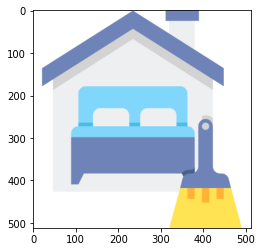

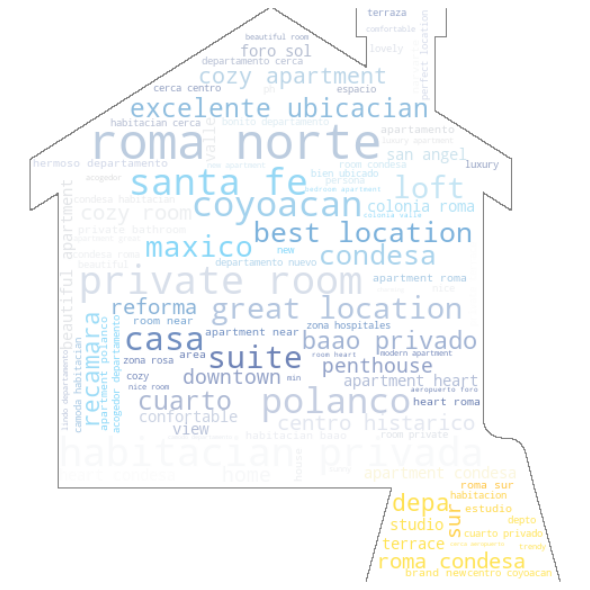

In [69]:
mask=transform_white_backgroud('clean.png')
image_colors=ImageColorGenerator(mask)
stopwords=set(STOPWORDS)
stopwords.add('mexico')
stopwords.add('city')
stopwords.add('cdmx')
stopwords.add('ciudad')
word_cloud = WordCloud(mask=mask, background_color='white', contour_width=1, contour_color='grey', max_words=200, min_font_size=5, stopwords=stopwords, collocation_threshold=10).generate(" ".join(df["t_name"]))

plt.figure(figsize=(10,8))
plt.imshow(word_cloud.recolor(color_func=image_colors), interpolation="bilinear")
#word_cloud.to_file("python.png")
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### Host name

Aunque realmente no nos brinda información relevante, me pareció un dato curioso conocer cuales son los nombres de host que son más recurrentes en la plataforma

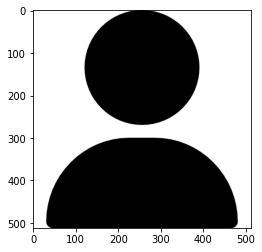

In [70]:
df["t_host_name"]=df["t_host_name"].map(str)
mask=transform_white_backgroud('user.png')

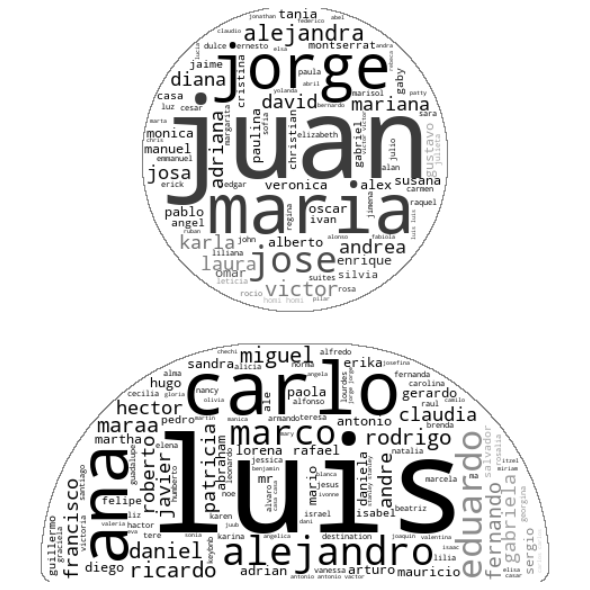

In [71]:
image_colors=ImageColorGenerator(mask)
stopwords=set(STOPWORDS)
word_cloud = WordCloud(mask=mask, background_color='white', contour_width=1, contour_color='grey', max_words=200, min_font_size=5, stopwords=stopwords, collocation_threshold=10).generate(" ".join(df["t_host_name"]))

plt.figure(figsize=(10,8))
plt.imshow(word_cloud.recolor(color_func=image_colors), interpolation="bilinear")
#word_cloud.to_file("python1.png")
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### Amenities

De manera similar a los gráficos anteriores quiero conocer cuales son los servicios que más se presentan en las propiedades de la plataforma

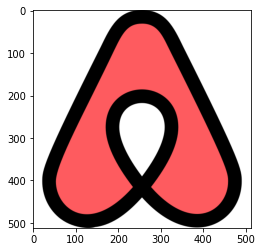

In [72]:
df['t_name_amenities']=df['t_amenities'].map(lambda x: str(x).replace('{','').replace('}','').replace('"','').replace(',',' '))
mask=transform_white_backgroud('airbnb.png')

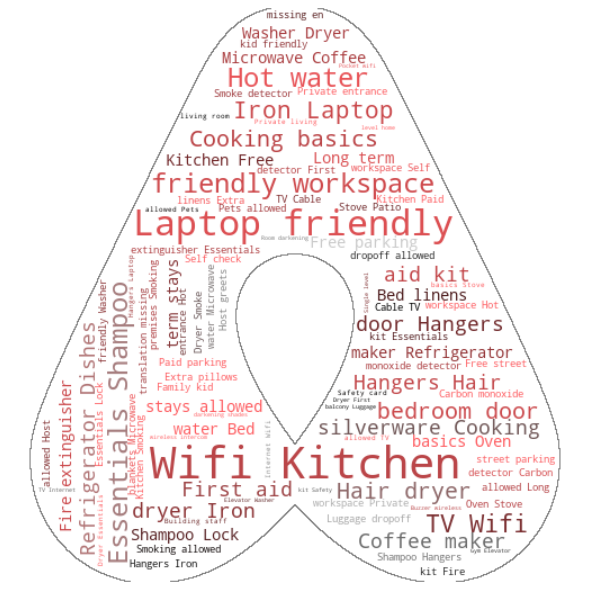

In [73]:
image_colors=ImageColorGenerator(mask)
stopwords=set(STOPWORDS)
word_cloud = WordCloud(mask=mask, background_color='white', contour_width=1, contour_color='grey', max_words=200, min_font_size=5, stopwords=stopwords, collocation_threshold=10).generate(" ".join(df["t_name_amenities"]))

plt.figure(figsize=(10,8))
plt.imshow(word_cloud.recolor(color_func=image_colors), interpolation="bilinear")
#word_cloud.to_file("python1.png")
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### Noches mínimas

Me parece interesante conocer que tan flexibles son las propiedades en la plataforma con la condición de noches mínimas para la renta del inmueble, como indica la tendencia se esperan resultados de estancias express, es decir, de una noche.

In [74]:
bar(df,'v_minimum_nights','Noches mínimas',10,x_title="",y_title="")

### Número de reviews último mes

Esta gráfica me parece muy importante, da información sobre la actividad reciente de las propiedades, podemos encontrar que con un mes antes del confinamiento las reseñas en las propiedades son muy bajas, con una concentración importante en cero reseñas. 

In [75]:
bar(df,'v_number_of_reviews_ltm','Número de reviews último mes',20,x_title="",y_title="")

### Politica de cancelación

Un dato importante a considerar por los huespedes al momento de reservar, es la política de cancelación de la propiedad, es interesante que predomina un criterio flexible a moderado, apoya la visión que se va formando sobre estancias de corto tiempo y fácilmente reservables.

In [76]:
#Politica de cancelacion
pie(df,'v_cancellation_policy','Politica de cancelación',x_title="",y_title="")

# Outliers

## Gráficos previos

In [77]:
for col in df.filter(like="c_"):
    print(col)
    histogram(df,col,10,col).show()
    box(df,col,col).show()
    print("\n")

c_host_listings_count




c_host_total_listings_count




c_latitude




c_longitude




c_bathrooms




c_extra_people




c_minimum_nights_avg_ntm




c_maximum_nights_avg_ntm


## Proceso Outliers

In [78]:
continuas=df.filter(like="c_").columns.tolist()
for c in continuas:
    results=[]
    stat ,  p  =  normaltest( list(df[c].dropna().values) )
    alpha = 0.05
    if p > alpha:
        results=print('La muestra parece una Normal (No se rechaza H0)')
    else:
        results=print('La muestra no parece una Normal (Se rechaza H0)')

La muestra no parece una Normal (Se rechaza H0)
La muestra no parece una Normal (Se rechaza H0)
La muestra no parece una Normal (Se rechaza H0)
La muestra no parece una Normal (Se rechaza H0)
La muestra no parece una Normal (Se rechaza H0)
La muestra no parece una Normal (Se rechaza H0)
La muestra no parece una Normal (Se rechaza H0)
La muestra no parece una Normal (Se rechaza H0)


Comenzaré con la variable 'c_host_listings_count' para explicar el análisis que se realizará posteriormente se ingresarán el resto de las variables a una función para repetir el proceso. Realizaremos el análsis por dos métodos para obtener información suficiente para tomar una decisión con respecto a cada variable, debido a que las variables no pasaron la prueba de normalidad

In [79]:
df['c_host_listings_count'].describe()

count    21519.000000
mean         7.394303
std         31.496475
min          0.000000
25%          1.000000
50%          2.000000
75%          5.000000
max        947.000000
Name: c_host_listings_count, dtype: float64

### IQR

Valor atípico si es más de 1.5 IQR por encima del tercer cuartil o por debajo del primer cuartil.

In [80]:
q1 = df['c_host_listings_count'].quantile(.25)
q3 = df['c_host_listings_count'].quantile(.75)
iqr = q3 - q1
ub = q3 + 1.5 * iqr
lb = q1 - 1.5 * iqr
n_iqr=df[(df['c_host_listings_count'] < lb) | (df['c_host_listings_count'] > ub)]['c_host_listings_count'].shape[0]
n_iqr

2441

In [81]:
df[(df['c_host_listings_count'] < lb) | (df['c_host_listings_count'] > ub)]['c_host_listings_count'].describe()

count    2441.000000
mean       45.965998
std        83.815185
min        12.000000
25%        18.000000
50%        26.000000
75%        44.000000
max       947.000000
Name: c_host_listings_count, dtype: float64

### Percentiles

Valor atípico fuera de los percentiles de 5 y 95, como banda inferior y como banda superior, respectivamente

In [82]:
lb = df['c_host_listings_count'].quantile(.05)
ub = df['c_host_listings_count'].quantile(.95)

In [83]:
n_percentiles=df[(df['c_host_listings_count'] < lb) | (df['c_host_listings_count'] > ub)]['c_host_listings_count'].shape[0]
n_percentiles

1046

### Generalización

Repetimos el proceso para el resto de las variables continuas y tomamos una decisión sobre los outliers presentes en los datos. Se selecciona los datos que se encuentran presentes en los tres métodos y son los que se retiraran de la tabla

In [84]:
df.drop('c_extra_people', axis=1, inplace=True)

In [85]:
c_feats_o=['c_host_listings_count','c_host_total_listings_count','c_minimum_nights_avg_ntm','c_maximum_nights_avg_ntm']

In [86]:
outls=OUTLIERS(df,c_feats_o)
outls

,features,n_outliers_IQR,n_outliers_Percentil,n_outliers_IQR_%,n_outliers_Percentil_%,total_outliers,%_outliers,indices
0,c_host_listings_count,2441,1046,11.34,4.86,1046,4.86,"[18437, 10250, 6155, 6157, 6159, 20500, 20501,..."
1,c_host_total_listings_count,2441,1046,11.34,4.86,1046,4.86,"[18437, 10250, 6155, 6157, 6159, 20500, 20501,..."
2,c_minimum_nights_avg_ntm,2411,822,11.20,3.82,822,3.82,"[8192, 8200, 10249, 16403, 12308, 4121, 4122, ..."
3,c_maximum_nights_avg_ntm,6,1082,0.03,5.03,6,0.03,"[2784, 2786, 2787, 2343, 4327, 2780]"


In [87]:
colors=dict(zip(list(outls['features'].values),Berlin_20.hex_colors))
fig2 = px.bar(outls, x='features', y="total_outliers",color='features',
             color_discrete_sequence=Berlin_20.hex_colors, title="Total de valores atípicos por variable")
fig2.show()

In [88]:
tableoutliers(df,outls)

,v_feature,c_n_rows
0,Inicial,21519
1,c_host_listings_count,20473
2,c_host_total_listings_count,20473
3,c_minimum_nights_avg_ntm,19682
4,c_maximum_nights_avg_ntm,19676


Se nota que se retira menos del 10% de registros de la tabla por outliers por lo que se procede con el proceso

In [89]:
df_new=dropoutliers(df,outls)
df_new.shape

(19676, 50)

In [90]:
#bar(df_new,'tgt_price','Precio',100,x_title="",y_title="")

Note que la diferencia en los precios podría provocar un comportamiento adverso en los modelos, por ello decidí segmentar la información considerando solamente la región donde los precios son más estables, ya que las propiedades de lujo son escasas y afectan la muestra por sus precios diferentes a los del resto de información. Para un análisis posterior se puede considerar crear dicha categoría de acuerdo a los datos que tenemos y enfrentrar un problema de clasificación.

In [91]:
df_total=df_new.copy()
#df_new=df_new[(df_new['tgt_price']<1801)]

### Gráficos finales

In [92]:
for col in c_feats_o:
    print(col)
    histogram(df_new,col,10,col).show()
    box(df_new,col,col).show()
    print("\n")

c_host_listings_count




c_host_total_listings_count




c_minimum_nights_avg_ntm




c_maximum_nights_avg_ntm


# Missings

## Transformar missings

A diferencia de la variable 't_name' es posible encontrar regularmente propiedades sin descripción y sin resumen que interactuan con la plataforma sin problema, por lo que únicamente cambiaremos el valor, 'sin resumen' y 'sin descripcion' para incluir el comportamiento de estos registros.

In [93]:
df_new['t_host_response_time']=df_new['t_host_response_time'].replace('nan',np.nan)
df_new['t_summary']=df_new['t_summary'].replace('nan','sin resumen')

## Proceso de imputación

In [94]:
completitud(df_new)

,columna,total,completitud
0,t_host_response_time,3527,0.820746
1,v_host_response_rate,3527,0.820746
2,v_host_acceptance_rate,2793,0.858050
3,v_zipcode,1092,0.944501
4,v_beds,152,0.992275
5,v_bedrooms,20,0.998984
6,c_bathrooms,7,0.999644


Noté que a las variables 'v_host_response_rate', 't_host_response_time' y 'v_host_response_rate' les faltan muchos datos y las variables están sesgadas con acumulados alrededor del 90-100 por lo que no nos aportan información útil y no podemos trabajar con esas variables por lo pronto, ya que imputar por moda o mediana no representaría mayor información para el análisis.

In [95]:
auxiliar_m=df_new[['v_host_response_rate','v_host_acceptance_rate','t_host_response_time']]
auxiliar_m.describe(percentiles=[0.05,0.1,0.25,0.5,0.9,0.95])

,v_host_response_rate,v_host_acceptance_rate
count,16149.000000,16883.000000
mean,92.962289,89.808624
std,19.696043,21.861456
min,0.000000,0.000000
5%,50.000000,40.000000
10%,80.000000,67.000000
25%,99.000000,92.000000
50%,100.000000,99.000000
90%,100.000000,100.000000
95%,100.000000,100.000000


In [96]:
df_new=df_new.drop(['v_host_response_rate','v_host_acceptance_rate','t_host_response_time'], axis=1)

Se separa la tabla para poder tratar con los missings mediante el conjunto de prueba y entrenamiento. Se considera una ponderación 80%-20%

In [97]:
X_train,X_test=train_test_split(df_new,test_size=.2,random_state=1235)

Obtenemos los valores nulos por columna de las variables discretas

In [98]:
X_train.filter(like="v_").isnull().sum()

v_host_is_superhost                                 0
v_host_identity_verified                            0
v_neighbourhood_cleansed                            0
v_zipcode                                         881
v_is_location_exact                                 0
v_property_type                                     0
v_room_type                                         0
v_accommodates                                      0
v_bedrooms                                         16
v_beds                                            120
v_guests_included                                   0
v_minimum_nights                                    0
v_maximum_nights                                    0
v_minimum_minimum_nights                            0
v_maximum_minimum_nights                            0
v_minimum_maximum_nights                            0
v_maximum_maximum_nights                            0
v_calendar_updated                                  0
v_availability_30           

Imputamos las variables por moda

In [99]:
mode_miss(X_train,X_test,'v_beds',df_new)

Aceptamos HO(La porporción de categorias es la misma que la general)


In [100]:
moda=X_train["v_beds"].mode()[0]
X_train["v_beds"]=X_train["v_beds"].fillna(moda)
X_test["v_beds"]=X_test["v_beds"].fillna(moda)
X_train["v_beds"]=X_train["v_beds"].map(int)
X_test["v_beds"]=X_test["v_beds"].map(int)

In [101]:
mode_miss(X_train,X_test,'v_bedrooms',df_new)

Aceptamos HO(La porporción de categorias es la misma que la general)


In [102]:
moda=X_train['v_bedrooms'].mode()[0]
X_train['v_bedrooms']=X_train['v_bedrooms'].fillna(moda)
X_test['v_bedrooms']=X_test['v_bedrooms'].fillna(moda)
X_train['v_bedrooms']=X_train['v_bedrooms'].map(int)
X_test['v_bedrooms']=X_test['v_bedrooms'].map(int)

In [103]:
mode_miss(X_train,X_test,'v_zipcode',df_new)

Aceptamos HO(La porporción de categorias es la misma que la general)


In [104]:
moda=X_train['v_zipcode'].mode()[0]
X_train['v_zipcode']=X_train['v_zipcode'].fillna(moda)
X_test['v_zipcode']=X_test['v_zipcode'].fillna(moda)
X_train['v_zipcode']=X_train['v_zipcode'].map(int)
X_test['v_zipcode']=X_test['v_zipcode'].map(int)

Realizamos un proceso similar para las variables continuas

In [105]:
X_train.filter(like="c_").isnull().sum()

c_host_listings_count          0
c_host_total_listings_count    0
c_latitude                     0
c_longitude                    0
c_bathrooms                    7
c_minimum_nights_avg_ntm       0
c_maximum_nights_avg_ntm       0
dtype: int64

In [106]:
col='c_bathrooms'
mean=X_train[col].dropna().mean()
median=X_train[col].dropna().median()
mode=X_train[col].dropna().mode()

In [107]:
originales=list(df_new[col].dropna().values)
imputados=list(df_new[col].fillna(mean).values)
stats.ks_2samp(originales,imputados)

KstestResult(statistic=0.00023808598270069758, pvalue=1.0)

In [108]:
originales=list(df_new[col].dropna().values)
imputados=list(df_new[col].fillna(median).values)
stats.ks_2samp(originales,imputados)

KstestResult(statistic=0.000117677383837278, pvalue=1.0)

In [109]:
originales=list(df_new[col].dropna().values)
imputados=list(df_new[col].fillna(mode).values)
stats.ks_2samp(originales,imputados)

KstestResult(statistic=0.00035576336653786456, pvalue=1.0)

De acuerdo con el estadístico se realiza la imputación por mediana

In [110]:
imp=SimpleImputer(missing_values=np.nan,strategy="median")
imp.fit(X_train[[col]])
X_train[[col]]=imp.transform(X_train[[col]])
X_test[[col]]=imp.transform(X_test[[col]])

In [111]:
completitud(X_train)

,columna,total,completitud


In [112]:
completitud(X_test)

,columna,total,completitud


# Ingenieria de variables

In [113]:
df_aux=pd.concat([X_test,X_train],sort=True)

df_aux=df_aux.reset_index().sort_values(by="index",axis=0).drop(columns=["index"])

Se obtienen dummies de las variables factor

In [114]:
def ing(df_aux):
    dum=['v_host_identity_verified','v_host_is_superhost','v_instant_bookable','v_is_location_exact']

    for v in dum:
        df_aux[v]=df_aux[v].map(lambda x: int(x=='t'))
        
    geo=[]
    distancia=[]
    for n in range(df_aux.shape[0]):
        l=[df_aux.c_latitude.iloc[n],df_aux.c_longitude.iloc[n]]
        geo.append(l)
    
    df_aux['geo']=geo
    
   
    for x in range(df_aux.shape[0]):
        km=semiverseno([19.4360,-99.0719],df_aux.geo.iloc[x])
        distancia.append(km)
        
    df_aux['c_distancia_aeropuerto']=distancia
    
    df_aux.drop('geo',axis=1,inplace=True)
    
    df_aux.reset_index(drop=True,inplace=True)
    
    df_aux=vectorizer('t_amenities',df_aux)
    df_aux=vectorizer('t_host_verifications',df_aux)
    df_aux=vectorizer('t_name',df_aux)
    
    df_aux['c_words_summary']=df_aux['t_summary'].map(lambda x: len(x))
    df_aux['c_words_name']=df_aux['t_name'].map(lambda x: len(x))
    
    df_aux.drop(['t_amenities','t_host_name','t_host_verifications','t_name','t_name_amenities','t_name_orig',
             't_summary','t_summary_original'],axis=1, inplace=True)
    
    df_aux['v_año_registro_host']=df_aux['d_host_since'].map(lambda x: x.year)
    df_aux['v_noches_reservadas_30dias']=30-df_aux.v_availability_30
    df_aux['c_habitacion_completa_por_huesped']=(df_aux.v_beds/df_aux.v_accommodates)*0.5+(df_aux.c_bathrooms/df_aux.v_accommodates)*0.5
    
    v_norm=['v_property_type','v_calendar_updated','v_neighbourhood_cleansed','v_room_type','v_cancellation_policy']

    mapa_norm = list(map(lambda v:normalizar(df_aux,v),v_norm))
    
    for v,d in mapa_norm:
        df_aux[v] = df_aux[v].replace(d)
    
    return df_aux

In [115]:
df_aux=ing(df_aux)

# Reduccion de dimensiones

## Relación de valor perdido

Se revisa la completitud de las variables, la tabla nos muestra las variables incompletas

In [116]:
completitud(df_aux)

,columna,total,completitud


In [ ]:
varc=df_aux.filter(like='c_').columns.tolist()

## Filtro de baja varianza

Se revisan las variables con baja varianza, no nos brinda información relevante por lo que se retirarán

In [117]:
vt = VarianceThreshold(threshold=0.1)

vt.fit(Xi)

,c_bathrooms,c_host_listings_count,c_host_total_listings_count,c_latitude,c_longitude,c_maximum_nights_avg_ntm,c_minimum_nights_avg_ntm,c_distancia_aeropuerto,c_words_summary,c_words_name,c_habitacion_completa_por_huesped
count,19676.000000,19676.000000,19676.000000,19676.000000,19676.000000,19676.00000,19676.000000,19676.000000,19676.000000,19676.000000,19676.000000
mean,1.377872,3.616436,3.616436,19.397474,-99.167993,749.38980,1.925122,11.929284,225.567900,31.223267,0.611464
std,0.759004,4.932903,4.932903,0.045761,0.034363,504.86565,1.245832,4.059110,114.309886,10.450742,0.353541
min,0.000000,0.000000,0.000000,19.168200,-99.340800,1.00000,1.000000,0.683100,1.000000,1.000000,0.000000
10%,1.000000,1.000000,1.000000,19.337100,-99.202500,18.00000,1.000000,7.808850,58.000000,16.000000,0.375000
20%,1.000000,1.000000,1.000000,19.361100,-99.185400,30.00000,1.000000,9.264400,119.000000,22.000000,0.428571
30%,1.000000,1.000000,1.000000,19.384200,-99.177300,150.00000,1.000000,9.979850,159.000000,27.000000,0.500000
40%,1.000000,1.000000,1.000000,19.400200,-99.172500,1125.00000,1.000000,10.653300,191.000000,30.000000,0.500000
50%,1.000000,2.000000,2.000000,19.410100,-99.167900,1125.00000,2.000000,11.221650,230.000000,33.000000,0.500000
60%,1.000000,2.000000,2.000000,19.416700,-99.162300,1125.00000,2.000000,11.900000,275.000000,35.000000,0.500000


In [ ]:
varianza_peq = [v for v,nu in zip(varc,vt.get_support()) if not nu]

In [ ]:
varc = [v for v in varc if v not in varianza_peq]

In [ ]:
df_aux.drop(varianza_peq,axis=1,inplace=True)

## Filtro de alta correlación

Analizamos las variables correlacionadas entre sí y conservamos las que nos aporten mayor información para nuestro objetivo

In [ ]:
corr=df_aux[[x for x in df_aux if x!="tgt_price"]].corr(method="spearman")
corr=abs(corr)

In [ ]:
for col in corr.columns:
    display(corr[[col]][corr[[col]]>.8].dropna())

In [122]:
cols=['c_host_listings_count','c_maximum_nights_avg_ntm','v_maximum_maximum_nights','v_minimum_maximum_nights',
     'c_minimum_nights_avg_ntm','v_maximum_minimum_nights','v_minimum_minimum_nights','v_availability_60',
     'v_availability_90','v_availability_365','v_number_of_reviews','t_amenities','t_host_verifications','t_host_name','t_name','t_name_orig','v_availability_30','t_summary','d_host_since']

df_aux=df_aux.drop(columns=cols)

## Correlación con la variable objetivo

In [123]:
corr=df_aux.corr(method="spearman")
corr=abs(corr)
corr[["tgt_price"]].sort_values(by = 'tgt_price',ascending = False).style.background_gradient()

,tgt_price
tgt_price,1.000000
v_room_type_private_room,0.641114
v_calculated_host_listings_count_entire_homes,0.598460
v_accommodates,0.585778
v_calculated_host_listings_count_private_rooms,0.521975
v_bedrooms,0.443996
v_beds,0.441812
habitacion_completa_por_huesped,0.372247
v_guests_included,0.323443
c_bathrooms,0.315470


Se eliminan las variables con correlacion menor a 10%

In [124]:
corr=corr[["tgt_price"]].sort_values(by = 'tgt_price',ascending = False)
cols_drop_low_corr=list(corr[corr["tgt_price"]<.1].index)
df_aux=df_aux.drop(columns=cols_drop_low_corr)

### Multicolinealidad

In [125]:
def calc_vif(X):
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

In [126]:
for col in df_aux.columns:
    df_aux[col]=df_aux[col].astype(float)
    
X=df_aux[[x for x in df_aux if x!="tgt_price"]]

In [127]:
df_aux2=calc_vif(X)

In [128]:
df_aux2[df_aux2["VIF"]>5]

,variables,VIF
0,c_bathrooms,1.336710e+01
1,c_host_total_listings_count,6.134538e+00
2,c_latitude,4.198647e+05
3,c_longitude,1.390346e+06
4,v_accommodates,3.241723e+01
5,v_bedrooms,1.207709e+01
6,v_beds,1.588690e+01
7,v_calculated_host_listings_count,4.538293e+01
8,v_calculated_host_listings_count_entire_homes,2.330573e+01
9,v_calculated_host_listings_count_private_rooms,1.459175e+01


In [129]:
df_aux.drop(['c_latitude','c_longitude','v_año_registro_host'],axis=1, inplace=True)

### PCA

In [130]:
df_aux.reset_index(drop=True, inplace=True)

In [131]:
prueba=df_aux.tail(100)
df_aux.drop(prueba.index, axis=0, inplace=True)
prueba.to_csv('prueba.csv')

In [132]:
X_train,X_test=train_test_split(df_aux,test_size=.2,random_state=24)
df_train=X_train[[x for x in X_train if x!="tgt_price"]]
df_test=X_test[[x for x in X_train if x!="tgt_price"]]
y_train=X_train[["tgt_price"]]
y_test=X_test[["tgt_price"]]

In [133]:
scaler = StandardScaler()
scaler.fit(df_train)
df_train_sc=pd.DataFrame(scaler.transform(df_train))
df_test_sc=pd.DataFrame(scaler.transform(df_train))

In [134]:
pca = PCA(n_components=18)
pca.fit(df_train_sc)

PCA(n_components=18)

In [135]:
X_train_pca=pd.DataFrame(pca.transform(df_train_sc))
X_test_pca=pd.DataFrame(pca.transform(df_test_sc))

In [136]:
pca.explained_variance_ratio_

array([0.17653796, 0.11410212, 0.0732029 , 0.05827673, 0.05560717,
       0.05400773, 0.05003198, 0.0469697 , 0.04534585, 0.04296162,
       0.04003129, 0.0372226 , 0.03290815, 0.03044667, 0.0282343 ,
       0.02338425, 0.02224614, 0.02143671])

In [137]:
varianza=list(pca.explained_variance_ratio_)
varianza=list(map(lambda x:sum(varianza[:x]),range(1,len(varianza)+1)))
cp=pd.DataFrame()
cp["n_componente"]=range(1,19)
cp["varianza"]=varianza
fig = go.Figure(data=go.Scatter(x=cp["n_componente"], y=cp["varianza"]))
fig.show()

In [138]:
pca = PCA(n_components=2)
dimention_2=pca.fit_transform(df_train_sc)
total_var = pca.explained_variance_ratio_.sum() * 100
fig = px.scatter(dimention_2, x=0, y=1,title=f'Total de Varianza Explicada: {total_var:.2f}%',
                 labels={'0': 'Componente Principal 1', '1': 'Componente Principal 2'})
fig.show()

In [139]:
pca = PCA(n_components=3)
dimention_3=pca.fit_transform(df_train_sc)

total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    dimention_3, x=0, y=1, z=2, 
    title=f'Total de Varianza Explicada: {total_var:.2f}%',
    labels={'0': 'CP 1', '1': 'CP 2', '2': 'CP 3'}
)
fig.show()

## Modelos

In [140]:
y_test.rename(columns={'tgt_price':'tgt'}, inplace=True)
y_train.rename(columns={'tgt_price':'tgt'}, inplace=True)

In [141]:
df_train.reset_index(inplace=True, drop=True)
df_test.reset_index(inplace=True,drop=True)
y_test.reset_index(inplace=True,drop=True)
y_train.reset_index(inplace=True,drop=True)

In [142]:
modelo=list(['Regresion Lineal', 'Lasso', 'Ridge','ElasticNet','AdaBoost'])
met, estrain, estest =Regresion(modelo, df_train, y_train, df_test, y_test)

/Users/DavidHC/diplomado/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/DavidHC/diplomado/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Fitting 10 folds for each of 90 candidates, totalling 900 fits


/Users/DavidHC/diplomado/lib/python3.8/site-packages/sklearn/model_selection/_split.py:666: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=10.

/Users/DavidHC/diplomado/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1036119.2111381292, tolerance: 144734.69239096658



Best Score : 0.5108894776003865
Best Params : {'alpha': 0.1, 'max_iter': 200}
Fitting 10 folds for each of 20 candidates, totalling 200 fits


/Users/DavidHC/diplomado/lib/python3.8/site-packages/sklearn/model_selection/_split.py:666: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=10.



Best Score : 0.5109085870452772
Best Params : {'alpha': 1.1}
Fitting 10 folds for each of 20 candidates, totalling 200 fits


/Users/DavidHC/diplomado/lib/python3.8/site-packages/sklearn/model_selection/_split.py:666: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=10.



Best Score : 0.4873830494844844
Best Params : {'alpha': 0.1}
Fitting 10 folds for each of 105 candidates, totalling 1050 fits


/Users/DavidHC/diplomado/lib/python3.8/site-packages/sklearn/model_selection/_split.py:666: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=10.

/Users/DavidHC/diplomado/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Best Score : 0.4623545236233218
Best Params : {'learning_rate': 0.1, 'n_estimators': 50}


In [143]:
met

,modelo,datos,r2,r2_adj,mae,mse,rmse
0,Regresion Lineal,train,0.514128,0.512780,216.982413,81026.162151,284.650948
1,Regresion Lineal,test,0.513364,0.507919,215.189044,80194.067113,283.185570
2,Lasso,train,0.514106,0.512759,217.022752,81029.691855,284.657148
3,Lasso,test,0.513166,0.507718,215.250091,80226.773945,283.243312
4,Ridge,train,0.514126,0.512778,217.003191,81026.433675,284.651425
5,Ridge,test,0.513286,0.507841,215.219859,80206.854221,283.208146
6,ElasticNet,train,0.490225,0.488811,225.250120,85012.271112,291.568639
7,ElasticNet,test,0.478245,0.472408,224.037066,85981.364427,293.225791
8,AdaBoost,train,0.466317,0.464837,239.696509,88999.277089,298.327466
9,AdaBoost,test,0.461131,0.455102,238.245983,88801.673722,297.996097


In [144]:
aux_train=estrain[:100]

for c in ['pred_train_regL', 'pred_train_Lasso','pred_train_Ridge', 'pred_train_ElasticNet']:
    print('\n'+c)
    aux_train[["tgt",c,"lower_pred","upper_pred"]].iplot()


pred_train_regL



pred_train_Lasso



pred_train_Ridge



pred_train_ElasticNet


In [145]:
aux_test=estest[:100]

for c in ['pred_test_regL', 'pred_test_Lasso','pred_test_Ridge', 'pred_test_ElasticNet']:
    aux_test[["tgt",c,"lower_pred","upper_pred"]].iplot()

met.to_excel('Estabilidad.xlsx', sheet_name='Metricas Regresion',index=False)

book = load_workbook('Estabilidad.xlsx')
writer = pd.ExcelWriter('Estabilidad.xlsx', engine='openpyxl') 
writer.book = book
aux_train.to_excel(writer, "Regresion Train", index= False)
aux_test.to_excel(writer, "Regresion Test",index=False)
writer.save()

In [150]:
model=LinearRegression()
model.fit(df_train,y_train)
y_pred_test=model.predict(df_test)
y_pred_train=model.predict(df_train)

import pickle
file='modelo_reg.pkl'

pickle.dump(model,open(file, 'wb'))

# ¡Muchas gracias!